# Install Dependencies

In [ ]:
# !pip install "pandas<2.0.0"
# !pip install scikit-learn==1.3.1
# !pip install folium
# !pip install geopandas
# !pip install mapclassify
# !pip install shapely
# !pip install matplotlib
# !pip install geemap earthengine-api
# !earthengine authenticate

In [ ]:
# %pip install libpysal esda

In [ ]:
# import ee
# ee.Authenticate(auth_mode='notebook', force=True)
# ee.Initialize()

In [ ]:
# # Install required packages
# !pip install google-auth-oauthlib
# !pip install earthengine-api geemap

In [ ]:
# !pip install rasterio

In [ ]:
# !pip install rasterstats

In [60]:
# # Initialize Earth Engine with high-level API access
# ee.Authenticate()
# ee.Initialize()

# Import Libraries

In [329]:
import pandas as pd
import numpy as np
import time
import logging
from sklearn.model_selection import (train_test_split, GridSearchCV, KFold,
                                     GroupKFold, ShuffleSplit, cross_val_score,
                                     RandomizedSearchCV)
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score, classification_report,
    mean_absolute_error, mean_squared_error, r2_score
)
from sklearn.ensemble import RandomForestRegressor
# import xgboost as xgb
# from xgboost import XGBRegressor
# import shap
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import pickle
import warnings
warnings.filterwarnings("ignore")

# from google.colab import drive
import geopandas as gpd
from shapely.geometry import Point,box, Polygon
import folium
from folium import plugins
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import omni_normtest, durbin_watson
from geopandas.tools import sjoin_nearest
import folium
from statsmodels.stats.diagnostic import linear_reset
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import make_scorer
from scipy.stats import randint, uniform, spearmanr , t
from scipy import stats

import libpysal
from esda.moran import Moran

import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_white, het_breuschpagan

# import ee
# import geemap
from datetime import datetime, timedelta
import os

import rasterio
from rasterio.mask import mask
from rasterstats import zonal_stats
from rasterio.plot import show

import math

pd.set_option('display.float_format', lambda x: '%.3f' % x)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.set_option("display.max_rows", None)

In [ ]:
# from google.colab import drive
# pd.set_option('display.float_format', lambda x: '%.3f' % x)
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
# # Initialize Earth Engine
# ee.Initialize()

# Data Collection

In [39]:
# Define Bali boundary
BALI_COORDS = [
    [114.42, -8.88],
    [114.42, -8.05],
    [115.7129, -8.05],
    [115.7129, -8.88],
    [114.45, -8.88]
]
bali_boundary = ee.Geometry.Polygon([BALI_COORDS])

In [40]:
# Define time period
START_DATE  = '2023-01-01'
END_DATE    = '2023-12-31'

In [41]:
# Create a map centered on Bali for visualization
Map = geemap.Map(center=[-8.45, 115.0], zoom=9)
Map.addLayer(bali_boundary, {}, 'Bali Boundary')
display(Map)

Map(center=[-8.45, 115.0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGU…

In [ ]:
# 1. Process Sentinel-2 data
print("Processing Sentinel-2 data...")
s2_collection = (ee.ImageCollection('COPERNICUS/S2_SR')
    .filterBounds(bali_boundary)
    .filterDate(START_DATE, END_DATE)
    .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20)))

Processing Sentinel-2 data...


In [43]:
# Calculate NDVI and NDBI
def calculateIndices(image):
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    ndbi = image.normalizedDifference(['B11', 'B8']).rename('NDBI')
    return image.addBands([ndvi, ndbi])

s2_with_indices = s2_collection.map(calculateIndices)
median_s2_indices = s2_with_indices.select(['NDVI', 'NDBI']).median()

In [44]:
# Visualize NDVI
Map.addLayer(median_s2_indices.select('NDVI'),
            {'min': -1, 'max': 1, 'palette': ['red', 'yellow', 'green']},
            'NDVI')

In [45]:
# Visualize NDBI
Map.addLayer(median_s2_indices.select('NDBI'),
            {'min': -1, 'max': 1, 'palette': ['blue', 'yellow', 'red']},
            'NDBI')

In [ ]:
# 2. Process Sentinel-5P data
print("Processing Sentinel-5P data...")
# NO2 data
no2_collection = (ee.ImageCollection('COPERNICUS/S5P/NRTI/L3_NO2')
    .filterBounds(bali_boundary)
    .filterDate(START_DATE, END_DATE)
    .select('NO2_column_number_density'))

# CO data
co_collection = (ee.ImageCollection('COPERNICUS/S5P/NRTI/L3_CO')
    .filterBounds(bali_boundary)
    .filterDate(START_DATE, END_DATE)
    .select('CO_column_number_density'))

median_no2 = no2_collection.median()
median_co = co_collection.median()

Processing Sentinel-5P data...


In [47]:
# Visualize NO2
Map.addLayer(median_no2,
            {'min': 0, 'max': 0.0002, 'palette': ['blue', 'yellow', 'red']},
            'NO2')

In [48]:
# Visualize CO
Map.addLayer(median_co,
            {'min': 0.03, 'max': 0.1, 'palette': ['blue', 'yellow', 'red']},
            'CO')

In [49]:
# 3. Process MODIS LST data
print("Processing MODIS LST data...")
lst_collection = (ee.ImageCollection('MODIS/061/MOD11A1')
    .filterBounds(bali_boundary)
    .filterDate(START_DATE, END_DATE)
    .select('LST_Day_1km'))

median_lst = lst_collection.median()
lst_celsius = median_lst.multiply(0.02).subtract(273.15)

Processing MODIS LST data...


In [50]:
# Visualize LST
Map.addLayer(lst_celsius,
            {'min': 20, 'max': 40, 'palette': ['blue', 'yellow', 'red']},
            'Land Surface Temperature')

In [51]:
# 4. Process VIIRS nighttime light data
print("Processing VIIRS nighttime light data...")
ntl_collection = (ee.ImageCollection('NOAA/VIIRS/DNB/MONTHLY_V1/VCMSLCFG')
    .filterBounds(bali_boundary)
    .filterDate(START_DATE, END_DATE)
    .select('avg_rad'))

median_ntl = ntl_collection.median()

Processing VIIRS nighttime light data...


In [52]:
# Visualize NTL
Map.addLayer(median_ntl,
            {'min': 0, 'max': 60, 'palette': ['black', 'yellow', 'red']},
            'Night Time Lights')

In [62]:
# Modified export function with authentication check
def export_to_drive(image, description, scale=1000):
    folder = 'bali_research'  # Just use the folder name, not full path
    try:
        task = ee.batch.Export.image.toDrive(
            image=image,
            description=description,
            folder=folder,
            scale=scale,
            region=bali_boundary,
            maxPixels=1e13,
            fileFormat='GeoTIFF'
        )
        task.start()
        print(f"Export started for {description}")
        return task
    except Exception as e:
        print(f"Error exporting {description}: {str(e)}")
        return None

In [55]:
# Export each layer separately
print("Starting exports...")

Starting exports...


In [72]:
# Test export with a single small dataset first
print("Testing export with NDVI...")
try:
    test_task = export_to_drive(
        image=median_s2_indices.select('NDVI'),
        description='bali_ndvi_2023_test'
    )
    if test_task:
        print("Test export task created successfully")
        print("Task status:", test_task.status()['state'])
except Exception as e:
    print(f"Test export failed: {str(e)}")

Testing export with NDVI...
Export started for bali_ndvi_2023_test
Test export task created successfully
Task status: READY


In [73]:
# Export all layers
export_tasks = []

In [74]:
# List of exports to process
exports = [
    (median_s2_indices.select('NDVI'), 'bali_ndvi_2023'),
    (median_s2_indices.select('NDBI'), 'bali_ndbi_2023'),
    (median_no2, 'bali_no2_2023'),
    (median_co, 'bali_co_2023'),
    (lst_celsius, 'bali_lst_2023'),
    (median_ntl, 'bali_ntl_2023')
]

In [75]:
# Process each export
for img, desc in exports:
    task = export_to_drive(img, desc)
    if task:
        export_tasks.append(task)
    # Wait a few seconds between exports to avoid rate limiting
    time.sleep(2)


Export started for bali_ndvi_2023
Export started for bali_ndbi_2023
Export started for bali_no2_2023
Export started for bali_co_2023
Export started for bali_lst_2023
Export started for bali_ntl_2023


In [76]:
# Monitor tasks
def monitor_tasks(tasks, wait=False):
    for task in tasks:
        if task:
            state = task.status()['state']
            desc = task.status()['description']
            print(f"Task {desc}: {state}")

    if wait:
        while any(task.active() for task in tasks if task):
            print("Waiting for exports to complete...")
            time.sleep(30)

In [77]:
# Check initial status
print("\nInitial task status:")
monitor_tasks(export_tasks)


Initial task status:
Task bali_ndvi_2023: RUNNING
Task bali_ndbi_2023: READY
Task bali_no2_2023: READY
Task bali_co_2023: READY
Task bali_lst_2023: READY
Task bali_ntl_2023: READY


# Data Loading and Grid Preparation

In [28]:
def calculate_degrees_per_km(latitude):
    """
    Calculate degrees per km at given latitude
    """
    earth_radius = 6371  # km
    deg_lat = (1 / earth_radius) * (180 / math.pi)
    deg_lon = deg_lat / math.cos(math.radians(latitude))
    return deg_lon, deg_lat

In [21]:
# bali = gpd.read_file('/content/drive/MyDrive/research/bali_research/wadm/Bali.geojson')
# bali = bali[bali['WADMKC'] != 'Nusa Penida']
# bali = bali.dissolve()
# bali = bali[['geometry']]

In [23]:
# bali.to_file('/content/drive/MyDrive/research/bali_research/wadm/bali.gpkg', driver='GPKG')

In [27]:
bali = gpd.read_file('/content/drive/MyDrive/research/bali_research/wadm/bali.gpkg')

In [83]:
# Convert to geographic coordinates (EPSG:4326) for verification
bali_geo = bali.to_crs('EPSG:4326')
print("\nGeographic bounds (EPSG:4326):")
print(bali_geo.total_bounds)


Geographic bounds (EPSG:4326):
[114.43162814  -8.84925897 115.71243601  -8.06162162]


In [104]:
# Convert back to EPSG:3246 for grid creation
bali_projected = bali_geo.to_crs('EPSG:3246')

# Get bounds in projected coordinates (meters)
xmin, ymin, xmax, ymax = bali_projected.total_bounds
print("\nProjected bounds (EPSG:3246):")
print(f"X range: {xmin:.2f} to {xmax:.2f}")
print(f"Y range: {ymin:.2f} to {ymax:.2f}")


Projected bounds (EPSG:3246):
X range: -4086523.65 to -3892339.53
Y range: -9748457.58 to -9576642.96


In [105]:
# Create 1km (1000m) grid
cell_size = 1000  # meters
cols = int(np.ceil((xmax - xmin) / cell_size))
rows = int(np.ceil((ymax - ymin) / cell_size))

print(f"\nGrid dimensions:")
print(f"Rows: {rows}")
print(f"Columns: {cols}")


Grid dimensions:
Rows: 172
Columns: 195


In [86]:
# Create grid cells in projected coordinates
grid_cells = []
for i in range(cols):
    for j in range(rows):
        left = xmin + (i * cell_size)
        bottom = ymin + (j * cell_size)
        grid_cells.append(box(left, bottom, left + cell_size, bottom + cell_size))

In [106]:
# Create GeoDataFrame in EPSG:4326
grid = gpd.GeoDataFrame({'geometry': grid_cells}, crs='EPSG:3246')

In [107]:
# Clip to Bali boundary
grid = gpd.sjoin(grid, bali_projected, how='inner', predicate='intersects')

In [108]:
grid.columns

Index(['geometry', 'index_right'], dtype='object')

In [109]:
grid = grid.drop(columns=['index_right'])

In [110]:
# Add grid ID
grid['grid_id'] = range(1, len(grid) + 1)

In [111]:
# Calculate area in km²
grid['area_km2'] = grid.area / 1_000_000

In [112]:
# Convert to geographic coordinates for visualization
grid_geo = grid.to_crs('EPSG:4326')
bali_geo = bali_projected.to_crs('EPSG:4326')

In [96]:
# # Project to EPSG:3246 for area calculation
# grid_geo = grid.to_crs('EPSG:3246')
# grid['area_km2'] = grid_geo.area / 1_000_000

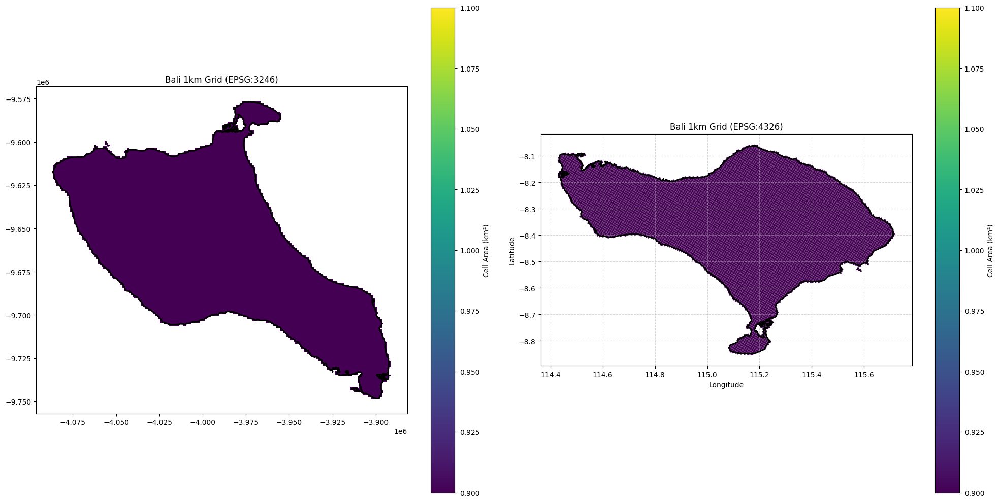

In [113]:
# Create two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Plot 1: Projected coordinates (EPSG:3246)
grid.plot(column='area_km2', ax=ax1, legend=True,
         legend_kwds={'label': 'Cell Area (km²)'})
bali_projected.boundary.plot(ax=ax1, color='black', linewidth=2)
ax1.set_title('Bali 1km Grid (EPSG:3246)')

# Plot 2: Geographic coordinates (EPSG:4326)
grid_geo.plot(column='area_km2', ax=ax2, legend=True,
             legend_kwds={'label': 'Cell Area (km²)'})
bali_geo.boundary.plot(ax=ax2, color='black', linewidth=2)
ax2.set_title('Bali 1km Grid (EPSG:4326)')
ax2.grid(True, linestyle='--', alpha=0.5)
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')

plt.tight_layout()
plt.show()

In [114]:
# Print area statistics
print("\nArea statistics (km²):")
print(grid['area_km2'].describe())


Area statistics (km²):
count   14135.000
mean        1.000
std         0.000
min         1.000
25%         1.000
50%         1.000
75%         1.000
max         1.000
Name: area_km2, dtype: float64


In [117]:
# Save both versions
grid.to_file('/content/drive/MyDrive/research/bali_research/bali_analysis_grid_3246.gpkg', driver='GPKG')
grid_geo.to_file('/content/drive/MyDrive/research/bali_analysis_grid_4326.gpkg', driver='GPKG')

In [2]:
grid = gpd.read_file('/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/bali_analysis_grid_3246.gpkg')
grid_geo = gpd.read_file('/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_analysis_grid_4326.gpkg')


In [115]:
# Quality check for 1km² cells
tolerance = 0.1  # 10% tolerance
full_cells = grid[grid['area_km2'] >= 0.9]  # Cells that are at least 90% complete
cells_near_1km = full_cells[
    (full_cells['area_km2'] >= 1 - tolerance) &
    (full_cells['area_km2'] <= 1 + tolerance)
]

print("\nGrid quality metrics:")
print(f"Total cells: {len(grid)}")
print(f"Full cells (>= 0.9 km²): {len(full_cells)}")
print(f"Cells within 10% of 1 km²: {len(cells_near_1km)} ({len(cells_near_1km)/len(grid)*100:.1f}%)")


Grid quality metrics:
Total cells: 14135
Full cells (>= 0.9 km²): 14135
Cells within 10% of 1 km²: 14135 (100.0%)


In [116]:
# Print detailed area distribution
print("\nArea distribution:")
for threshold in [0.25, 0.5, 0.75, 0.9, 1.0]:
    count = len(grid[grid['area_km2'] >= threshold])
    print(f"Cells >= {threshold} km²: {count} ({count/len(grid)*100:.1f}%)")


Area distribution:
Cells >= 0.25 km²: 14135 (100.0%)
Cells >= 0.5 km²: 14135 (100.0%)
Cells >= 0.75 km²: 14135 (100.0%)
Cells >= 0.9 km²: 14135 (100.0%)
Cells >= 1.0 km²: 14135 (100.0%)


# Integration of GeoTIFF and GeoPackage Data

In [30]:
# File paths
base_path = '/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research'
files = {
    'grid': 'bali_analysis_grid_3246.gpkg',
    'ndvi': 'bali_ndvi_2023.tif',
    'ndbi': 'bali_ndbi_2023.tif',
    'no2': 'bali_no2_2023.tif',
    'co': 'bali_co_2023.tif',
    'lst': 'bali_lst_2023.tif',
    'ntl': 'bali_ntl_2023.tif'
}

In [ ]:
def load_and_combine_data():
    """
    Load and combine all geospatial data with proper CRS handling
    """
    # Load the analysis grid
    print("Loading analysis grid...")
    grid = gpd.read_file(f"{base_path}/{files['grid']}")
    print(f"Original grid CRS: {grid.crs}")
    
    # Convert grid to EPSG:4326 to match raster data
    grid_4326 = grid.to_crs('EPSG:4326')
    print(f"Converted grid CRS: {grid_4326.crs}")
    print(f"Number of grid cells: {len(grid_4326)}")
    
    # Initialize dictionary to store zonal statistics
    all_stats = {}
    
    # Process each raster layer
    raster_files = {k: v for k, v in files.items() if k != 'grid'}
    
    for layer_name, filename in raster_files.items():
        print(f"\nProcessing {layer_name}...")
        
        # Check raster CRS
        with rasterio.open(f"{base_path}/{filename}") as src:
            print(f"{layer_name} CRS: {src.crs}")
        
        try:
            # Calculate zonal statistics
            stats = zonal_stats(
                grid_4326.geometry,
                f"{base_path}/{filename}",
                stats=['mean', 'std', 'min', 'max'],
                nodata=np.nan
            )
            
            # Convert to DataFrame
            stats_df = pd.DataFrame(stats)
            
            # Add prefix to column names
            stats_df.columns = [f'{layer_name}_{col}' for col in stats_df.columns]
            
            # Store in dictionary
            all_stats[layer_name] = stats_df
            
            # Print basic statistics
            print(f"Statistics for {layer_name}:")
            print(stats_df[f'{layer_name}_mean'].describe())
            
        except Exception as e:
            print(f"Error processing {layer_name}: {str(e)}")
            continue
    
    # Combine all statistics with grid
    result = grid.copy()  # Keep original projected CRS
    for layer_name, stats_df in all_stats.items():
        for col in stats_df.columns:
            result[col] = stats_df[col]
    
    # Print final dataset info
    print("\nFinal dataset information:")
    print(f"Total features: {len(result)}")
    print(f"Total columns: {len(result.columns)}")
    print("\nColumns:")
    for col in result.columns:
        print(f"- {col}")
    
    # Check for missing values
    mean_columns = [col for col in result.columns if col.endswith('_mean')]
    print("\nMissing values:")
    print(result[mean_columns].isnull().sum())
    
    # Create correlation matrix for mean values
    correlation_matrix = result[mean_columns].corr()
    
    # Plot correlation heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(correlation_matrix, 
                annot=True, 
                cmap='coolwarm', 
                center=0,
                fmt='.2f')
    plt.title('Feature Correlation Matrix')
    plt.tight_layout()
    plt.show()
    
    # Save combined dataset
    # output_file = f"{base_path}/combined_features_3246.gpkg"
    # result.to_file(output_file, driver='GPKG')
    # print(f"\nCombined dataset saved to: {output_file}")
    
    return result

Loading analysis grid...
Original grid CRS: EPSG:3246
Converted grid CRS: EPSG:4326
Number of grid cells: 14135

Processing ndvi...
ndvi CRS: EPSG:4326
Statistics for ndvi:
count   5679.000
mean       0.375
std        0.115
min       -0.069
25%        0.319
50%        0.399
75%        0.458
max        0.569
Name: ndvi_mean, dtype: float64

Processing ndbi...
ndbi CRS: EPSG:4326
Statistics for ndbi:
count   5679.000
mean      -0.134
std        0.071
min       -0.370
25%       -0.188
50%       -0.144
75%       -0.088
max        0.125
Name: ndbi_mean, dtype: float64

Processing no2...
no2 CRS: EPSG:4326
Statistics for no2:
count   5679.000
mean       0.000
std        0.000
min        0.000
25%        0.000
50%        0.000
75%        0.000
max        0.000
Name: no2_mean, dtype: float64

Processing co...
co CRS: EPSG:4326
Statistics for co:
count   5679.000
mean       0.026
std        0.002
min        0.022
25%        0.025
50%        0.026
75%        0.027
max        0.030
Name: co_mean,

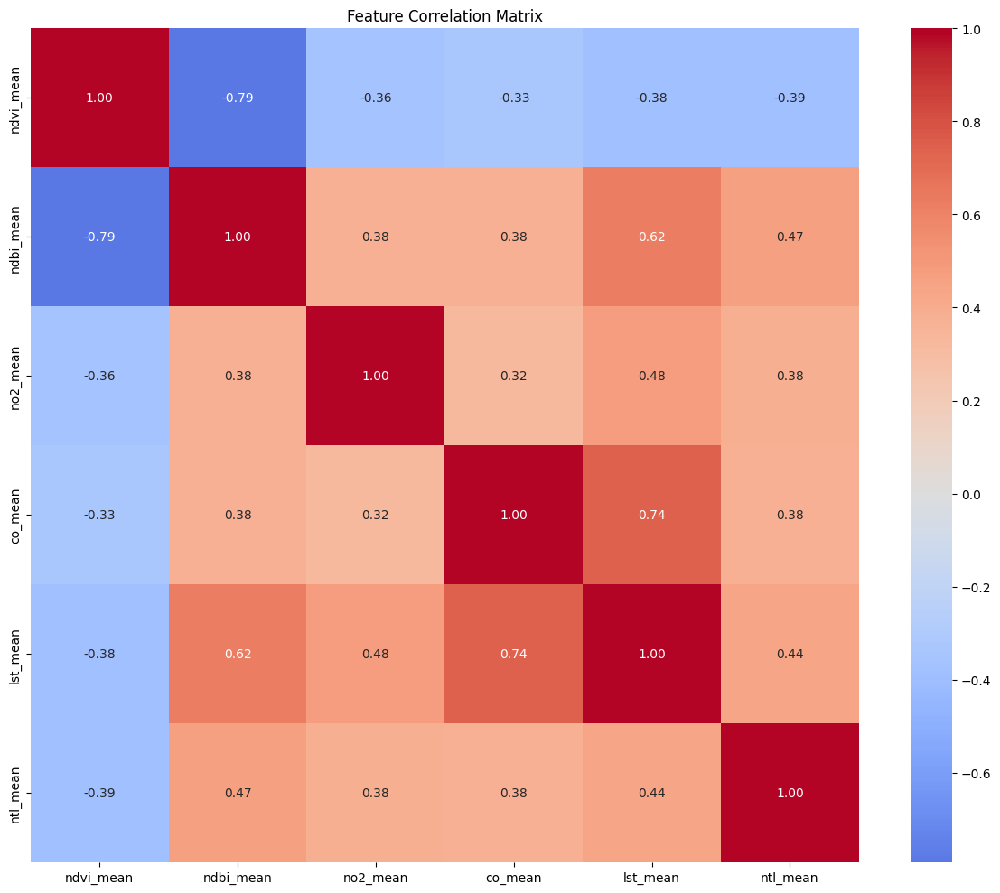


Combined dataset saved to: /Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/combined_features_3246.gpkg


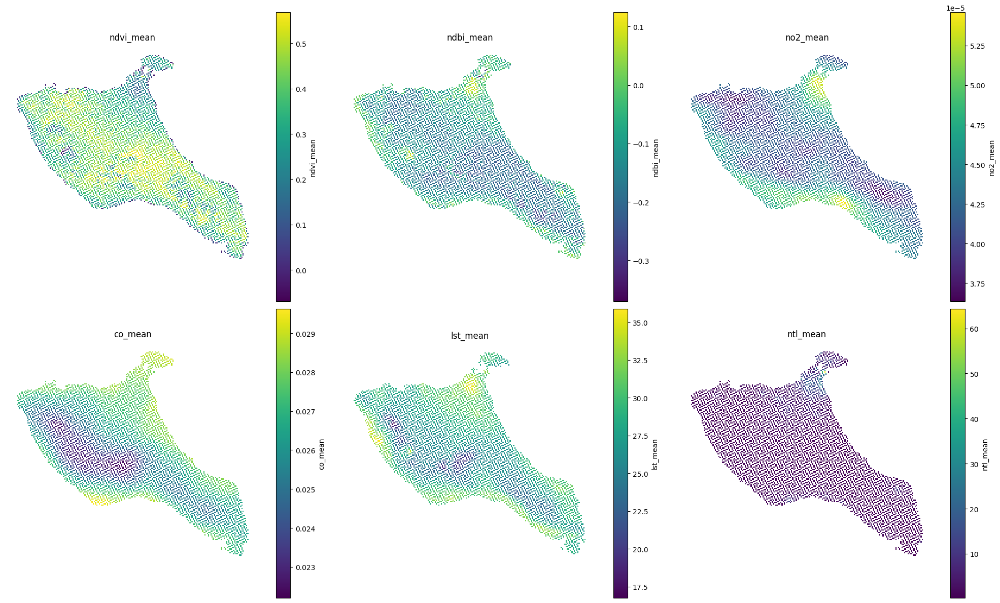

In [32]:
# Run the data integration
try:
    combined_data = load_and_combine_data()
    
    # Quick visualization of a few key features
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.ravel()
    
    features_to_plot = ['ndvi_mean', 'ndbi_mean', 'no2_mean', 
                        'co_mean', 'lst_mean', 'ntl_mean']
    
    for idx, feature in enumerate(features_to_plot):
        combined_data.plot(column=feature, 
                          ax=axes[idx], 
                          legend=True,
                          legend_kwds={'label': feature})
        axes[idx].set_title(feature)
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
except Exception as e:
    print(f"An error occurred: {str(e)}")

# SGPI Calculation with Multiple Methods

NaN values count per column:
ndvi_mean    8456
ndbi_mean    8456
no2_mean     8456
co_mean      8456
lst_mean     8679
ntl_mean     8456
dtype: int64

Total rows: 14135
Rows with any NaN: 8679

Number of NaN values per row:
0    5456
1     223
6    8456
dtype: int64


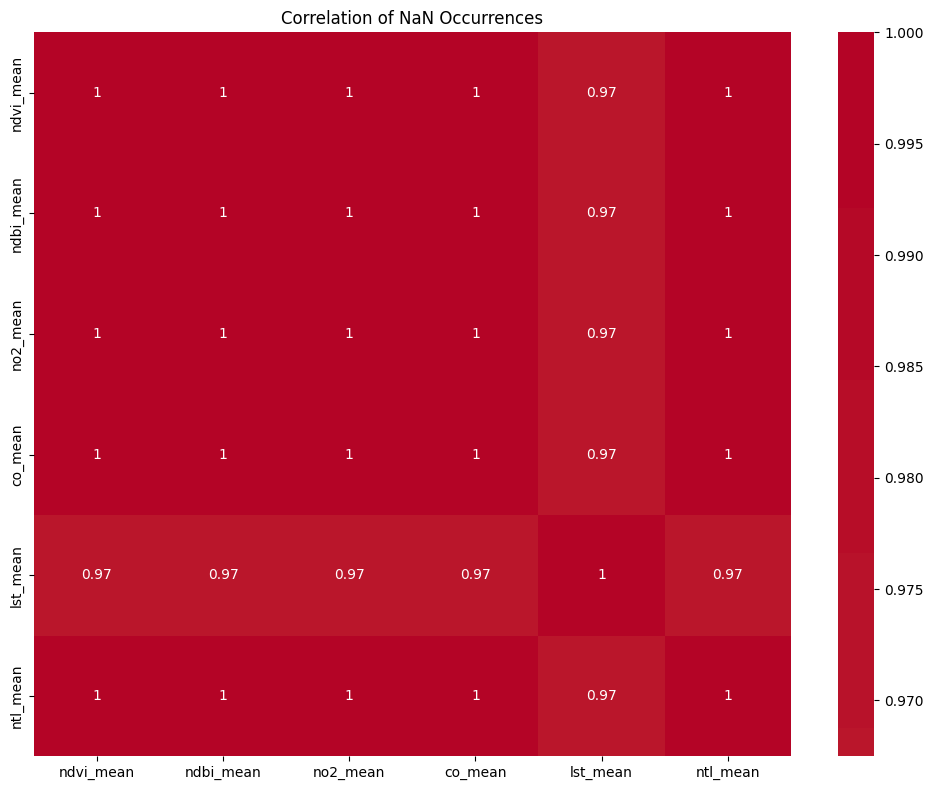

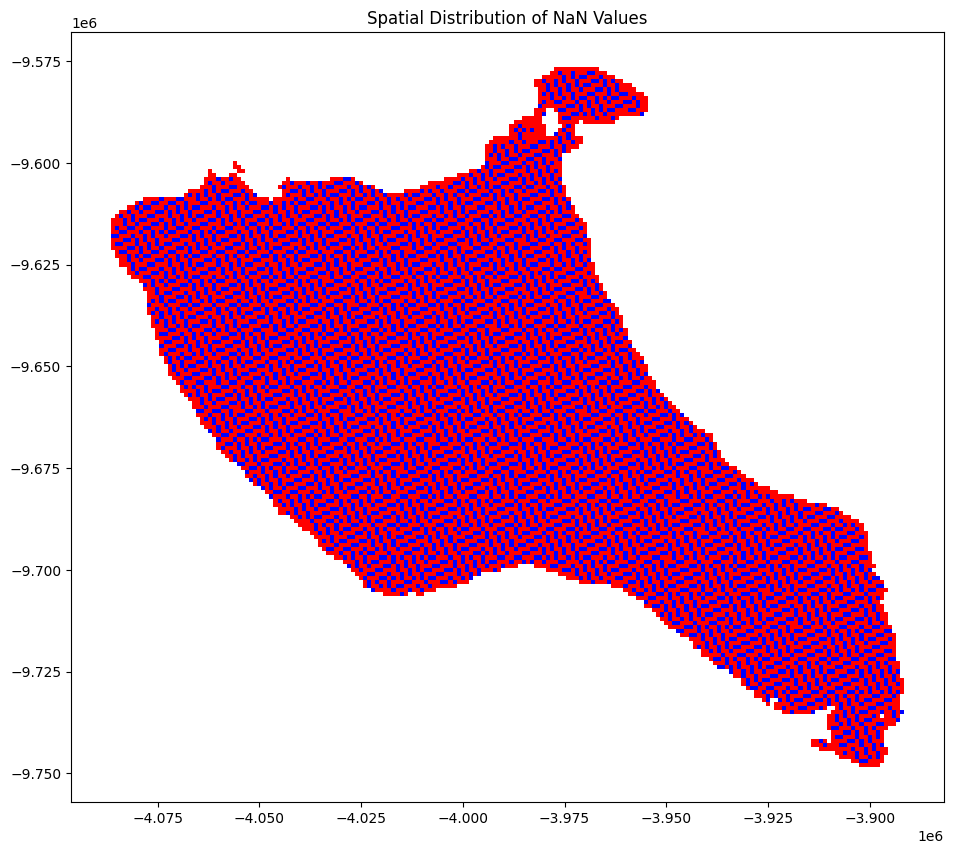

In [39]:
# Load data
data_path = '/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/combined_features_3246.gpkg'
data = gpd.read_file(data_path)

# Define feature columns
feature_cols = [
    'ndvi_mean',
    'ndbi_mean',
    'no2_mean',
    'co_mean',
    'lst_mean',
    'ntl_mean'
]

# Check for NaN values
print("NaN values count per column:")
print(data[feature_cols].isna().sum())

print("\nTotal rows:", len(data))
print("Rows with any NaN:", data[feature_cols].isna().any(axis=1).sum())

# Analyze NaN patterns
def analyze_nan_patterns(df, columns):
    """Analyze patterns in NaN values"""
    nan_patterns = df[columns].isna().sum(axis=1)
    print("\nNumber of NaN values per row:")
    print(nan_patterns.value_counts().sort_index())
    
    # Create correlation matrix of NaN occurrences
    nan_corr = pd.DataFrame(
        {col: df[col].isna().astype(int) for col in columns}
    ).corr()
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(nan_corr, annot=True, cmap='coolwarm', center=0)
    plt.title('Correlation of NaN Occurrences')
    plt.tight_layout()
    plt.show()

analyze_nan_patterns(data, feature_cols)

# Plot spatial distribution of NaNs
fig, ax = plt.subplots(figsize=(15, 10))
data.plot(
    color=data[feature_cols].isna().any(axis=1).map({True: 'red', False: 'blue'}),
    ax=ax,
    legend=True,
    legend_kwds={'labels': ['Complete', 'Has NaN']}
)
plt.title('Spatial Distribution of NaN Values')
plt.show()

# Handle NaN values
def handle_nan_values(df, columns, method='remove'):
    """
    Handle NaN values using specified method
    """
    if method == 'remove':
        # Remove rows with any NaN
        clean_df = df.dropna(subset=columns)
        print(f"\nRows after NaN removal: {len(clean_df)}")
        
    elif method == 'fill_mean':
        # Fill NaN with column means
        clean_df = df.copy()
        clean_df[columns] = clean_df[columns].fillna(clean_df[columns].mean())
        
    elif method == 'fill_spatial':
        # Fill NaN using spatial interpolation
        clean_df = df.copy()
        for col in columns:
            # Convert to geodataframe for spatial interpolation
            temp_gdf = gpd.GeoDataFrame(
                clean_df[['geometry', col]],
                geometry='geometry',
                crs=clean_df.crs
            )
            # Get centroids
            centroids = temp_gdf.geometry.centroid
            # Get coordinates
            coords = np.column_stack((
                centroids.x.values,
                centroids.y.values
            ))
            # Get non-NaN values
            known_values = ~temp_gdf[col].isna()
            if known_values.any():
                from scipy.interpolate import NearestNDInterpolator
                interpolator = NearestNDInterpolator(
                    coords[known_values],
                    temp_gdf[col].values[known_values]
                )
                # Fill NaN values
                nan_idx = temp_gdf[col].isna()
                temp_gdf.loc[nan_idx, col] = interpolator(coords[nan_idx])
                clean_df[col] = temp_gdf[col]
    
    return clean_df

In [40]:
# Try different NaN handling methods
removed_nan = handle_nan_values(data, feature_cols, 'remove')
filled_mean = handle_nan_values(data, feature_cols, 'fill_mean')
filled_spatial = handle_nan_values(data, feature_cols, 'fill_spatial')

# Compare statistics before and after NaN handling
print("\nOriginal data statistics:")
print(data[feature_cols].describe())

print("\nAfter mean filling statistics:")
print(filled_mean[feature_cols].describe())

print("\nAfter spatial filling statistics:")
print(filled_spatial[feature_cols].describe())


Rows after NaN removal: 5456

Original data statistics:
       ndvi_mean  ndbi_mean  no2_mean  co_mean  lst_mean  ntl_mean
count   5679.000   5679.000  5679.000 5679.000  5456.000  5679.000
mean       0.375     -0.134     0.000    0.026    27.713     1.816
std        0.115      0.071     0.000    0.002     2.758     3.174
min       -0.069     -0.370     0.000    0.022    16.745     0.211
25%        0.319     -0.188     0.000    0.025    25.920     0.475
50%        0.399     -0.144     0.000    0.026    27.716     0.811
75%        0.458     -0.088     0.000    0.027    29.705     1.603
max        0.569      0.125     0.000    0.030    35.875    64.326

After mean filling statistics:
       ndvi_mean  ndbi_mean  no2_mean   co_mean  lst_mean  ntl_mean
count  14135.000  14135.000 14135.000 14135.000 14135.000 14135.000
mean       0.375     -0.134     0.000     0.026    27.713     1.816
std        0.073      0.045     0.000     0.001     1.714     2.012
min       -0.069     -0.370     0.00

In [41]:
# Save cleaned datasets
removed_nan.to_file(data_path.replace('.gpkg', '_cleaned_removed.gpkg'), driver='GPKG')
filled_mean.to_file(data_path.replace('.gpkg', '_cleaned_mean.gpkg'), driver='GPKG')
filled_spatial.to_file(data_path.replace('.gpkg', '_cleaned_spatial.gpkg'), driver='GPKG')

print("\nCleaned datasets have been saved.")


Cleaned datasets have been saved.


# POI

In [170]:
def calculate_poi_distances(grid_gdf, poi_gdf, poi_type):
    """
    Calculate distances to nearest POIs for each grid cell
    """
    print(f"\nProcessing {poi_type} POIs...")
    
    # Ensure same CRS
    if grid_gdf.crs != poi_gdf.crs:
        poi_gdf = poi_gdf.to_crs(grid_gdf.crs)
    
    # Get centroids of grid cells and reset index
    grid_centroids = grid_gdf.copy()
    grid_centroids['geometry'] = grid_gdf.geometry.centroid
    grid_centroids = grid_centroids.reset_index(drop=True)
    
    # Reset index for POI geodataframe as well
    poi_gdf = poi_gdf.reset_index(drop=True)
    
    # Find nearest POI and calculate distance
    nearest_join = sjoin_nearest(
        grid_centroids,
        poi_gdf,
        how='left',
        distance_col=f'distance_{poi_type}'
    )
    
    # Convert distance to kilometers
    nearest_join[f'distance_{poi_type}'] = nearest_join[f'distance_{poi_type}'] / 1000
    
    # Group by grid cell index and take minimum distance if there are duplicates
    distances = nearest_join.groupby(nearest_join.index)[f'distance_{poi_type}'].min()
    
    return distances

In [179]:
grid = gpd.read_file('/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/combined_features_3246_cleaned_spatial.gpkg')

In [180]:
# Load your POI data
education_poi = gpd.read_file('/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/education_bali.geojson')
healthcare_poi = gpd.read_file('/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/healthcare_bali.geojson')
economic_poi = gpd.read_file('/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/economic_activities_bali.geojson')

In [181]:
education_poi.to_crs(epsg=3246, inplace=True)
healthcare_poi.to_crs(epsg=3246, inplace=True)
economic_poi.to_crs(epsg=3246, inplace=True)

In [182]:
# Calculate distances for each POI type
grid['education_dist'] = calculate_poi_distances(grid, education_poi, 'education')
grid['healthcare_dist'] = calculate_poi_distances(grid, healthcare_poi, 'healthcare')
grid['economic_dist'] = calculate_poi_distances(grid, economic_poi, 'economic')


Processing education POIs...

Processing healthcare POIs...

Processing economic POIs...


In [183]:
grid.columns

Index(['grid_id', 'area_km2', 'ndvi_min', 'ndvi_max', 'ndvi_mean', 'ndvi_std',
       'ndbi_min', 'ndbi_max', 'ndbi_mean', 'ndbi_std', 'no2_min', 'no2_max',
       'no2_mean', 'no2_std', 'co_min', 'co_max', 'co_mean', 'co_std',
       'lst_mean', 'lst_std', 'lst_min', 'lst_max', 'ntl_min', 'ntl_max',
       'ntl_mean', 'ntl_std', 'geometry', 'education_dist', 'healthcare_dist',
       'economic_dist'],
      dtype='object')

In [184]:
# Save cleaned datasets
grid.to_file('/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/combined_features_3246_cleaned_spatial_with_poi.gpkg', driver='GPKG')

In [336]:
grid.columns

Index(['grid_id', 'area_km2', 'ndvi_min', 'ndvi_max', 'ndvi_mean', 'ndvi_std',
       'ndbi_min', 'ndbi_max', 'ndbi_mean', 'ndbi_std', 'no2_min', 'no2_max',
       'no2_mean', 'no2_std', 'co_min', 'co_max', 'co_mean', 'co_std',
       'lst_mean', 'lst_std', 'lst_min', 'lst_max', 'ntl_min', 'ntl_max',
       'ntl_mean', 'ntl_std', 'geometry', 'education_dist', 'healthcare_dist',
       'economic_dist'],
      dtype='object')


Dataset Description:
        grid_id  area_km2  ndvi_min  ndvi_max  ndvi_mean  ndvi_std  ndbi_min  \
count 14135.000 14135.000  5679.000  5679.000  14135.000  5679.000  5679.000   
mean   7068.000     1.000     0.375     0.375      0.376     0.000    -0.134   
std    4080.567     0.000     0.115     0.115      0.112     0.000     0.071   
min       1.000     1.000    -0.069    -0.069     -0.069     0.000    -0.370   
25%    3534.500     1.000     0.319     0.319      0.321     0.000    -0.188   
50%    7068.000     1.000     0.399     0.399      0.399     0.000    -0.144   
75%   10601.500     1.000     0.458     0.458      0.458     0.000    -0.088   
max   14135.000     1.000     0.569     0.569      0.569     0.000     0.125   

       ndbi_max  ndbi_mean  ndbi_std  no2_min  no2_max  no2_mean  no2_std  \
count  5679.000  14135.000  5679.000 5679.000 5679.000 14135.000 5679.000   
mean     -0.134     -0.134     0.000    0.000    0.000     0.000    0.000   
std       0.071      0.071

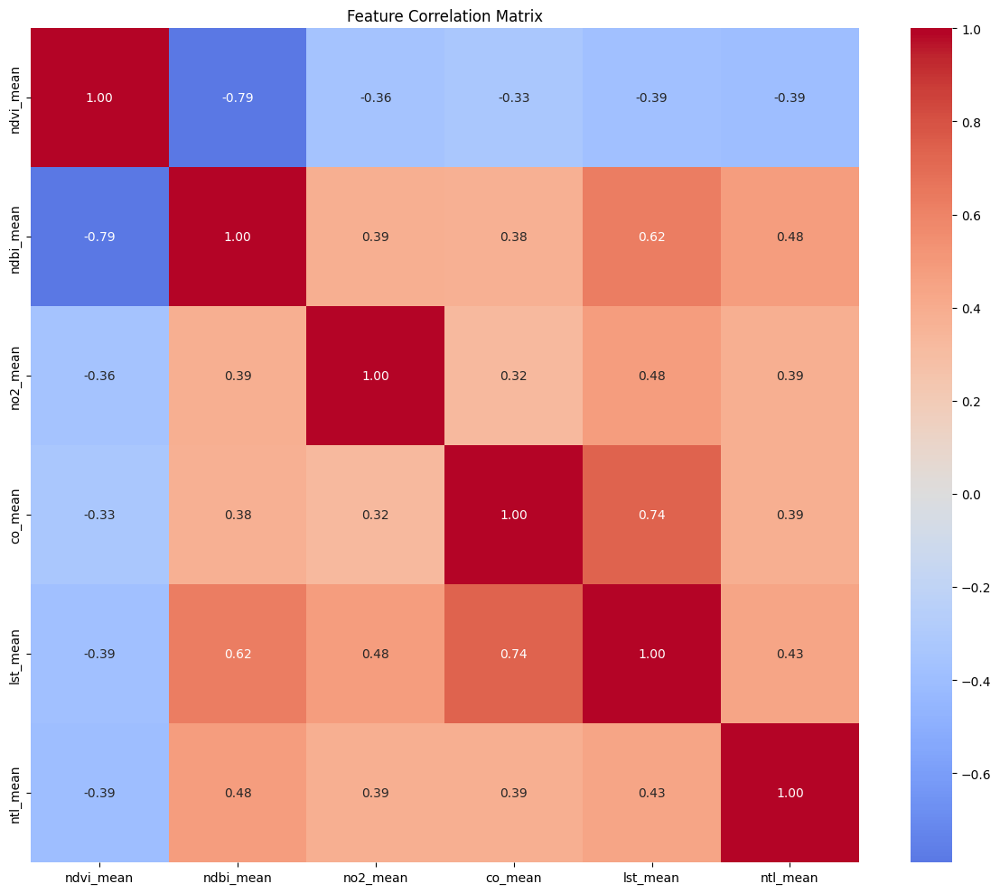

In [337]:
# Describe the dataset
print("\nDataset Description:")
print(grid.describe())

# Display dataset information
print("\nFinal dataset information:")
print(f"Total features: {len(grid)}")
print(f"Total columns: {len(grid.columns)}")

print("\nColumns:")
for col in grid.columns:
    print(f"- {col}")

# Identify columns ending with '_mean'
mean_columns = [col for col in grid.columns if col.endswith('_mean')]

# Check for missing values
print("\nMissing values:")
missing_values = grid[mean_columns].isnull().sum()
print(missing_values)

# Create correlation matrix for columns ending with '_mean'
correlation_matrix = grid[mean_columns].corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, 
            annot=True, 
            cmap='coolwarm', 
            center=0,
            fmt='.2f')
plt.title('Feature Correlation Matrix')
plt.tight_layout()
plt.show()

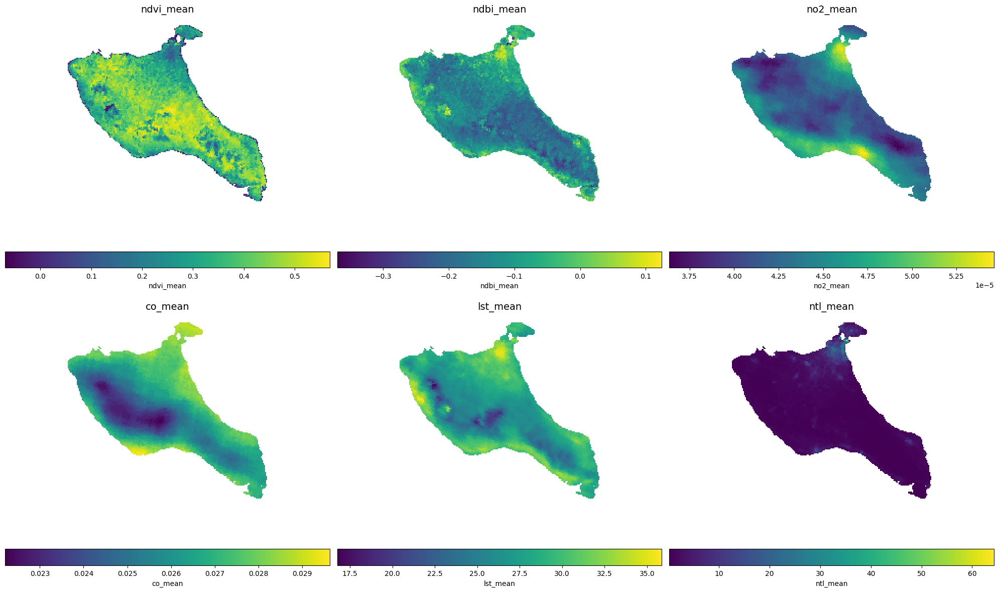

In [340]:
# Quick visualization of a few key features
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.ravel()

# Define the features to plot
features_to_plot = ['ndvi_mean', 'ndbi_mean', 'no2_mean', 
                    'co_mean', 'lst_mean', 'ntl_mean']

for idx, feature in enumerate(features_to_plot):
    if feature in grid.columns:
        grid.plot(column=feature, 
                  ax=axes[idx], 
                  legend=True,
                  legend_kwds={'label': feature, 'orientation': 'horizontal'})
        axes[idx].set_title(feature, fontsize=14)
        axes[idx].axis('off')
    else:
        axes[idx].text(0.5, 0.5, f"{feature} not in dataset", 
                       horizontalalignment='center', 
                       verticalalignment='center', 
                       fontsize=12)
        axes[idx].axis('off')

plt.tight_layout()
plt.show()

# Transform Data and SGPI Result

In [185]:
# Load the cleaned data
data_path = '/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/combined_features_3246_cleaned_spatial_with_poi.gpkg'
data = gpd.read_file(data_path)

# First update feature_cols to include POI distances
feature_cols = [
    'ndvi_mean', 'ndbi_mean', 'no2_mean', 'co_mean', 
    'lst_mean', 'ntl_mean', 'education_dist', 
    'healthcare_dist', 'economic_dist'
]

In [196]:
def transform_data(df, method='standard'):
    """Apply data transformation with fixes for scaling"""
    X = df[feature_cols].copy()
    
    if method == 'yeo-johnson':
        # First apply Yeo-Johnson
        X_transformed = np.zeros_like(X)
        for i, col in enumerate(X.columns):
            # Cap lambda parameter range
            transformed, lambda_param = stats.yeojohnson(X[col])
            X_transformed[:, i] = transformed
        
        # Then apply standard scaling to equalize ranges
        scaler = StandardScaler()
        X_transformed = scaler.fit_transform(X_transformed)
    elif method == 'standard':
        transformer = StandardScaler()
        X_transformed = transformer.fit_transform(X)
    elif method == 'minmax':
        transformer = MinMaxScaler()
        X_transformed = transformer.fit_transform(X)
            
    return pd.DataFrame(X_transformed, columns=X.columns, index=X.index)

def calculate_ews(df_transformed):
    """Calculate Equal-Weighted Sum SGPI"""
    weights = {
        'ndvi_mean': 1,    # Positive correlation with poverty
        'ndbi_mean': -1,   # Negative correlation
        'no2_mean': -1,    # Negative correlation
        'co_mean': -1,     # Negative correlation
        'lst_mean': -1,    # Negative correlation
        'ntl_mean': -1,    # Negative correlation
        'education_dist': 1,    # Positive correlation (further = more poverty)
        'healthcare_dist': 1,   # Positive correlation
        'economic_dist': 1      # Positive correlation
    }
    
    sgpi = np.zeros(len(df_transformed))
    for col in feature_cols:
        sgpi += df_transformed[col] * weights[col]
    
    return sgpi

def calculate_pccws(df_transformed):
    """Calculate Pearson Correlation Coefficient Weighted Sum SGPI"""
    # Using weights from the paper
    weights = {
        'ndvi_mean': 0.314,
        'ndbi_mean': -0.543,
        'no2_mean': -0.596,
        'co_mean': -0.414,
        'lst_mean': -0.605,
        'ntl_mean': -0.595,
        'education_dist': 0.525,    # From paper
        'healthcare_dist': 0.535,   # From paper
        'economic_dist': 0.453      # From paper
    }
    
    sgpi = np.zeros(len(df_transformed))
    for col in feature_cols:
        sgpi += df_transformed[col] * weights[col]
    
    return sgpi

def calculate_pcaws(df_transformed):
    """Calculate PCA Weighted Sum SGPI"""
    pca = PCA(n_components=1)
    pca_result = pca.fit_transform(df_transformed)
    
    # Get loadings from first component
    loadings = pd.Series(pca.components_[0], index=feature_cols)
    print("\nPCA loadings:")
    print(loadings)
    
    sgpi = np.zeros(len(df_transformed))
    for col in feature_cols:
        sgpi += df_transformed[col] * loadings[col]
    
    return sgpi

In [197]:
# Calculate all SGPI variants
results = data[['geometry', 'grid_id']].copy()

In [198]:
# Apply each transformation and method combination
transformations = ['minmax', 'standard', 'yeo-johnson']
methods = ['ews', 'pccws', 'pcaws']

In [199]:
for transform in transformations:
    print(f"\nProcessing {transform} transformation...")
    transformed_data = transform_data(data, transform)
    
    # Calculate EWS
    results[f'SGPI_EWS_{transform}'] = calculate_ews(transformed_data)
    
    # Calculate PCCWS
    results[f'SGPI_PCCWS_{transform}'] = calculate_pccws(transformed_data)
    
    # Calculate PCAWS
    results[f'SGPI_PCAWS_{transform}'] = calculate_pcaws(transformed_data)


Processing minmax transformation...

PCA loadings:
ndvi_mean         -0.274
ndbi_mean          0.287
no2_mean           0.263
co_mean            0.422
lst_mean           0.320
ntl_mean           0.082
education_dist    -0.363
healthcare_dist   -0.366
economic_dist     -0.469
dtype: float64

Processing standard transformation...

PCA loadings:
ndvi_mean         -0.317
ndbi_mean          0.394
no2_mean           0.275
co_mean            0.330
lst_mean           0.402
ntl_mean           0.341
education_dist    -0.290
healthcare_dist   -0.316
economic_dist     -0.314
dtype: float64

Processing yeo-johnson transformation...

PCA loadings:
ndvi_mean         -0.297
ndbi_mean          0.357
no2_mean           0.210
co_mean            0.323
lst_mean           0.377
ntl_mean           0.390
education_dist    -0.314
healthcare_dist   -0.353
economic_dist     -0.345
dtype: float64


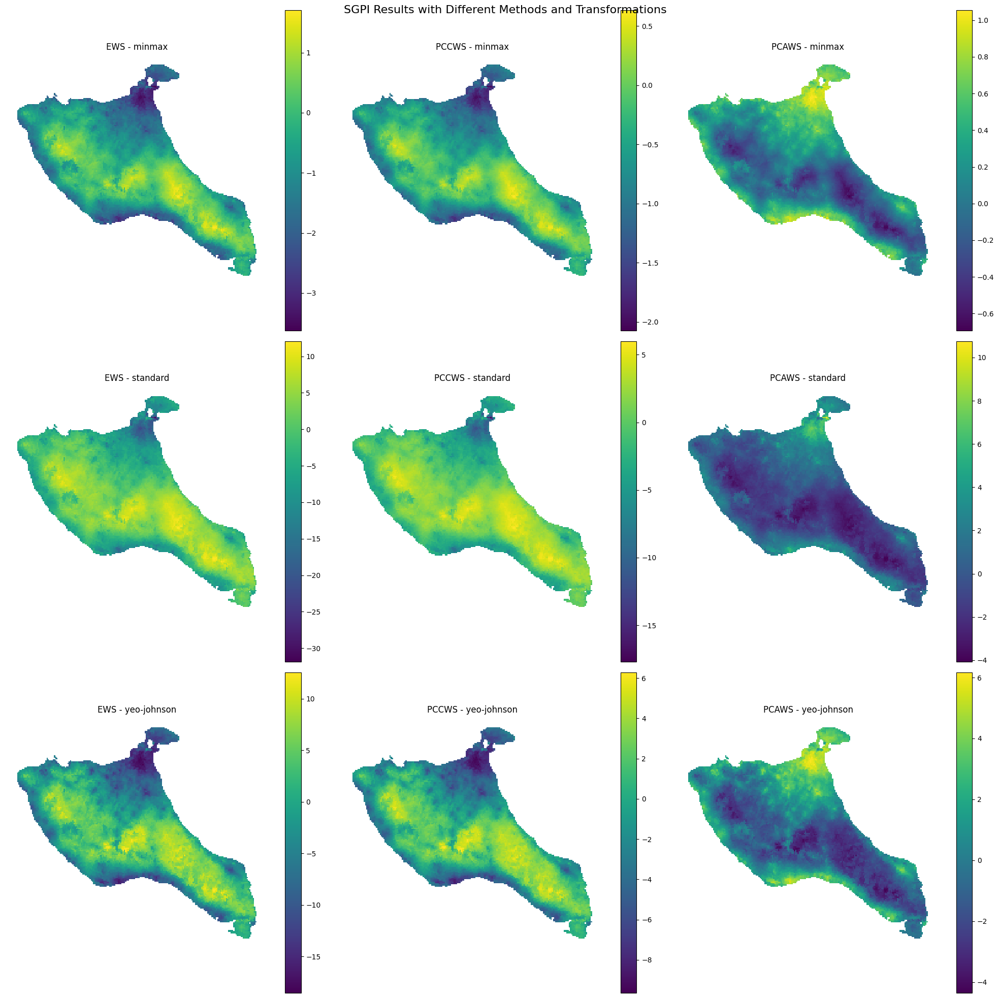

In [200]:
# Plot results
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
fig.suptitle('SGPI Results with Different Methods and Transformations', size=16)

for i, transform in enumerate(transformations):
    for j, method in enumerate(methods):
        col = f'SGPI_{method.upper()}_{transform}'
        results.plot(column=col, ax=axes[i,j], legend=True)
        axes[i,j].set_title(f'{method.upper()} - {transform}')
        axes[i,j].axis('off')

plt.tight_layout()
plt.show()

In [201]:
# Save results
output_path = '/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/sgpi_results.gpkg'
results.to_file(output_path, driver='GPKG')

In [202]:
# Print summary statistics for each SGPI variant
sgpi_cols = [col for col in results.columns if col.startswith('SGPI')]
print("\nSGPI Statistics:")
print(results[sgpi_cols].describe())


SGPI Statistics:
       SGPI_EWS_minmax  SGPI_PCCWS_minmax  SGPI_PCAWS_minmax  \
count        14135.000          14135.000          14135.000   
mean            -0.490             -0.447              0.136   
std              1.015              0.506              0.354   
min             -3.625             -2.073             -0.692   
25%             -1.243             -0.822             -0.141   
50%             -0.380             -0.388              0.111   
75%              0.311             -0.054              0.409   
max              1.707              0.635              1.054   

       SGPI_EWS_standard  SGPI_PCCWS_standard  SGPI_PCAWS_standard  \
count          14135.000            14135.000            14135.000   
mean               0.000                0.000               -0.000   
std                6.055                3.104                2.032   
min              -31.866              -17.698               -4.073   
25%               -4.122               -2.103          

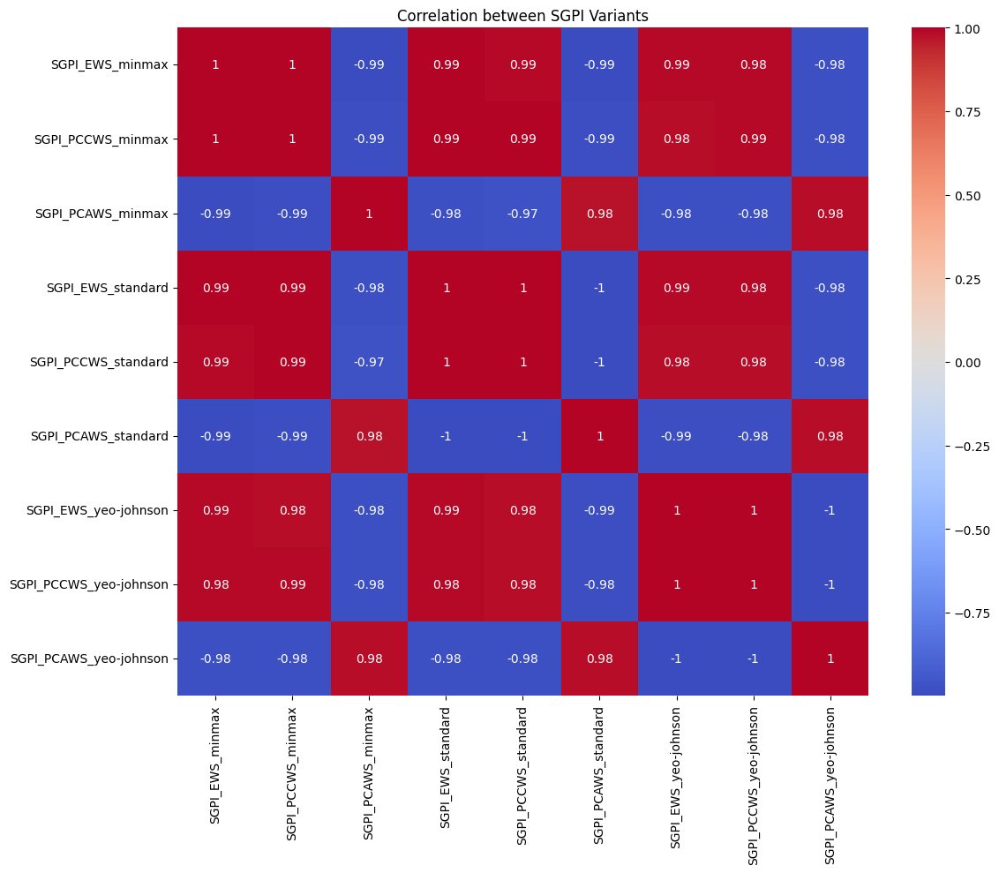

In [203]:
# Correlation between different SGPI variants
correlation_matrix = results[sgpi_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation between SGPI Variants')
plt.tight_layout()
plt.show()

In [225]:
# Official poverty data 2023
poverty_data = pd.DataFrame({
    'regency': ['Kab. Jembrana', 'Kab. Tabanan', 'Kab. Badung', 'Kab. Gianyar',
                'Kab. Klungkung', 'Kab. Bangli', 'Kab. Karangasem', 'Kab. Buleleng',
                'Kota Denpasar'],
    'poverty_rate': [4.96, 4.70, 2.30, 4.47, 5.61, 5.28, 6.56, 5.85, 2.68],
    'poverty_depth': [0.38, 0.52, 0.11, 0.42, 0.58, 0.75, 0.62, 0.53, 0.35],
    'poverty_severity': [0.04, 0.09, 0.01, 0.06, 0.09, 0.17, 0.09, 0.08, 0.10]
})

In [226]:
# Load SGPI results
sgpi_path = '/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/sgpi_results.gpkg'
sgpi_grid = gpd.read_file(sgpi_path)

In [227]:
wadm_bali = gpd.read_file('/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/wadm/Bali.geojson')

In [228]:
wadmkk_bali = wadm_bali.dissolve(by='WADMKK')

In [229]:
wadmkk_bali.reset_index(inplace=True)

In [230]:
wadmkk_bali.columns

Index(['WADMKK', 'geometry', 'FCODE', 'LUASWH', 'WADMKC', 'WADMKD', 'WADMPR',
       'WIADKC', 'WIADKK', 'WIADPR', 'WIADKD', 'UUPP', 'LUAS'],
      dtype='object')

In [231]:
wadmkk_bali = wadmkk_bali[['geometry','WADMKK']]

In [232]:
wadmkk_bali['WADMKK'].unique()

array(['Badung', 'Bangli', 'Buleleng', 'Gianyar', 'Jembrana',
       'Karangasem', 'Klungkung', 'Kota Denpasar', 'Tabanan'],
      dtype=object)

In [233]:
wadmkk_mapping = {
    'Badung': 'Kab. Badung',
    'Bangli': 'Kab. Bangli',
    'Buleleng': 'Kab. Buleleng',
    'Gianyar': 'Kab. Gianyar',
    'Jembrana': 'Kab. Jembrana',
    'Karangasem': 'Kab. Karangasem',
    'Klungkung': 'Kab. Klungkung',
    'Kota Denpasar': 'Kota Denpasar',
    'Tabanan': 'Kab. Tabanan'
}

wadmkk_bali['regency'] = wadmkk_bali['WADMKK'].map(wadmkk_mapping)

print(wadmkk_bali['regency'].unique())

['Kab. Badung' 'Kab. Bangli' 'Kab. Buleleng' 'Kab. Gianyar'
 'Kab. Jembrana' 'Kab. Karangasem' 'Kab. Klungkung' 'Kota Denpasar'
 'Kab. Tabanan']


In [234]:
wadmkk_bali_3246 = wadmkk_bali.to_crs(epsg=3246)

In [235]:
regencies = wadmkk_bali_3246.copy()

In [239]:
#  Spatial join SGPI grid with regencies
sgpi_with_regency = gpd.sjoin(sgpi_grid, regencies, how='left', predicate='within')

In [240]:
# Aggregate SGPI values by regency (mean)
sgpi_columns = [col for col in sgpi_grid.columns if col.startswith('SGPI')]

In [ ]:
aggregated_sgpi = sgpi_with_regency.groupby('regency')[sgpi_columns].mean()

In [241]:
# Calculate mean and standard error for each SGPI variant
aggregated_stats = {}
for col in sgpi_columns:
    means = sgpi_with_regency.groupby('regency')[col].mean()
    stderrs = sgpi_with_regency.groupby('regency')[col].sem()
    aggregated_stats[col] = means
    aggregated_stats[f'{col}_stderr'] = stderrs

aggregated_sgpi = pd.DataFrame(aggregated_stats)

# Print first few rows
print("\nAggregated SGPI statistics:")
print(aggregated_sgpi.head())


Aggregated SGPI statistics:
               SGPI_EWS_minmax  SGPI_EWS_minmax_stderr  SGPI_PCCWS_minmax  \
regency                                                                     
Kab. Badung             -1.478                   0.033             -0.938   
Kab. Bangli              0.045                   0.014             -0.184   
Kab. Buleleng           -0.488                   0.018             -0.465   
Kab. Gianyar            -1.060                   0.025             -0.731   
Kab. Jembrana            0.282                   0.015             -0.047   

               SGPI_PCCWS_minmax_stderr  SGPI_PCAWS_minmax  \
regency                                                      
Kab. Badung                       0.016              0.479   
Kab. Bangli                       0.006             -0.059   
Kab. Buleleng                     0.009              0.125   
Kab. Gianyar                      0.012              0.359   
Kab. Jembrana                     0.007             -0.139 

In [ ]:
# Align data and calculate correlations
# Ensure alignment
common_regencies = sorted(list(set(poverty_data['regency']) & set(aggregated_sgpi.index)))
aligned_poverty = poverty_data.set_index('regency').loc[common_regencies]
aligned_sgpi = aggregated_sgpi.loc[common_regencies]

# Calculate correlations with confidence intervals
correlations = {}
confidence_level = 0.95

for col in [c for c in aligned_sgpi.columns if not c.endswith('_stderr')]:
    correlations[col] = {}
    for metric in ['poverty_rate', 'poverty_depth', 'poverty_severity']:
        # Calculate Pearson correlation and p-value
        corr, p_value = stats.pearsonr(aligned_sgpi[col], aligned_poverty[metric])
        
        # Calculate confidence interval using Fisher z-transformation
        z = np.arctanh(corr)
        stderr = 1.0/np.sqrt(len(aligned_sgpi)-3)
        z_crit = stats.norm.ppf((1 + confidence_level)/2)
        ci_lower = np.tanh(z - z_crit * stderr)
        ci_upper = np.tanh(z + z_crit * stderr)
        
        correlations[col][metric] = {
            'correlation': corr,
            'p_value': p_value,
            'ci_lower': ci_lower,
            'ci_upper': ci_upper
        }

correlation_df = pd.DataFrame(correlations)

# Print correlation results
print("\nCorrelation Analysis Results:")
for col in correlation_df.columns:
    print(f"\n{col}:")
    for metric in correlation_df.index:
        result = correlation_df.loc[metric, col]
        print(f"{metric}:")
        print(f"  Correlation: {result['correlation']:.3f}")
        print(f"  95% CI: ({result['ci_lower']:.3f}, {result['ci_upper']:.3f})")
        print(f"  p-value: {result['p_value']:.3f}")


Correlation Analysis Results:

SGPI_EWS_minmax:
poverty_rate:
  Correlation: 0.714
  95% CI: (0.096, 0.935)
  p-value: 0.031
poverty_depth:
  Correlation: 0.529
  95% CI: (-0.208, 0.883)
  p-value: 0.143
poverty_severity:
  Correlation: 0.164
  95% CI: (-0.562, 0.747)
  p-value: 0.674

SGPI_PCCWS_minmax:
poverty_rate:
  Correlation: 0.707
  95% CI: (0.081, 0.933)
  p-value: 0.033
poverty_depth:
  Correlation: 0.519
  95% CI: (-0.221, 0.880)
  p-value: 0.152
poverty_severity:
  Correlation: 0.151
  95% CI: (-0.570, 0.741)
  p-value: 0.697

SGPI_PCAWS_minmax:
poverty_rate:
  Correlation: -0.702
  95% CI: (-0.932, -0.071)
  p-value: 0.035
poverty_depth:
  Correlation: -0.531
  95% CI: (-0.883, 0.206)
  p-value: 0.141
poverty_severity:
  Correlation: -0.187
  95% CI: (-0.757, 0.545)
  p-value: 0.631

SGPI_EWS_standard:
poverty_rate:
  Correlation: 0.727
  95% CI: (0.121, 0.938)
  p-value: 0.026
poverty_depth:
  Correlation: 0.527
  95% CI: (-0.211, 0.882)
  p-value: 0.145
poverty_severity

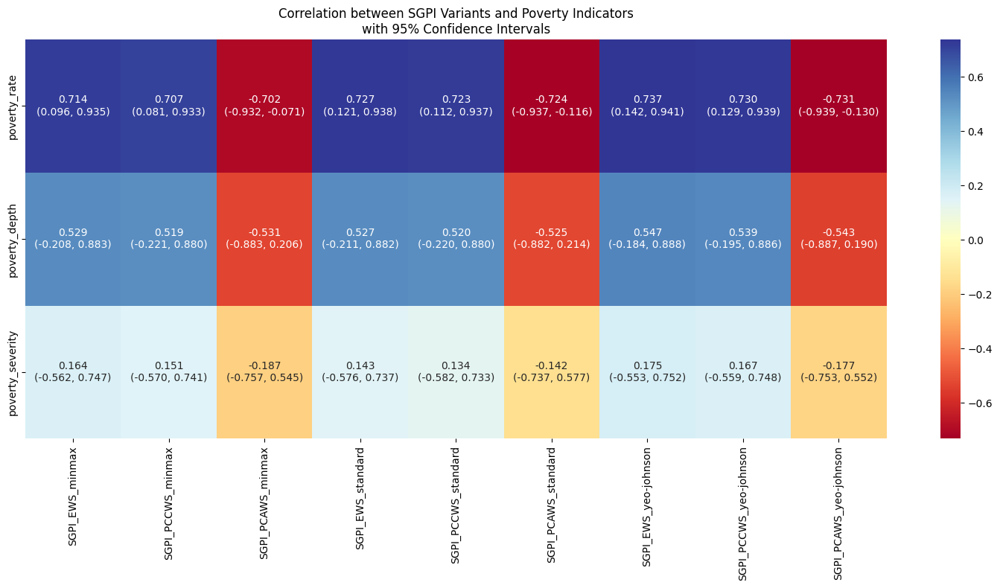

In [ ]:
#  Plot correlation heatmap
plt.figure(figsize=(15, 8))

# Create annotation text with correlation and confidence intervals
annot_text = np.zeros_like(correlation_df, dtype=object)
for i in range(correlation_df.shape[0]):
    for j in range(correlation_df.shape[1]):
        val = correlation_df.iloc[i,j]
        annot_text[i,j] = f'{val["correlation"]:.3f}\n({val["ci_lower"]:.3f}, {val["ci_upper"]:.3f})'

# Plot heatmap using correlation values only
corr_values = correlation_df.applymap(lambda x: x['correlation'])
sns.heatmap(corr_values, annot=annot_text, fmt='', cmap='RdYlBu', center=0)

plt.title('Correlation between SGPI Variants and Poverty Indicators\nwith 95% Confidence Intervals')
plt.tight_layout()
plt.show()

In [ ]:
#  Find best performing SGPI and calculate spatial autocorrelation
best_sgpi = correlation_df.applymap(lambda x: abs(x['correlation'])).max().idxmax()
print(f"\nBest performing SGPI variant: {best_sgpi}")

# Calculate Moran's I for best SGPI
w = libpysal.weights.Queen.from_dataframe(sgpi_grid)
w.transform = 'r'
moran = Moran(sgpi_grid[best_sgpi], w)

print("\nSpatial Autocorrelation Results:")
print(f"Moran's I: {moran.I:.3f}")
print(f"p-value: {moran.p_sim:.3f}")
print(f"z-score: {moran.z_sim:.3f}")


Best performing SGPI variant: SGPI_EWS_yeo-johnson

Spatial Autocorrelation Results:
Moran's I: 0.971
p-value: 0.001
z-score: 226.441


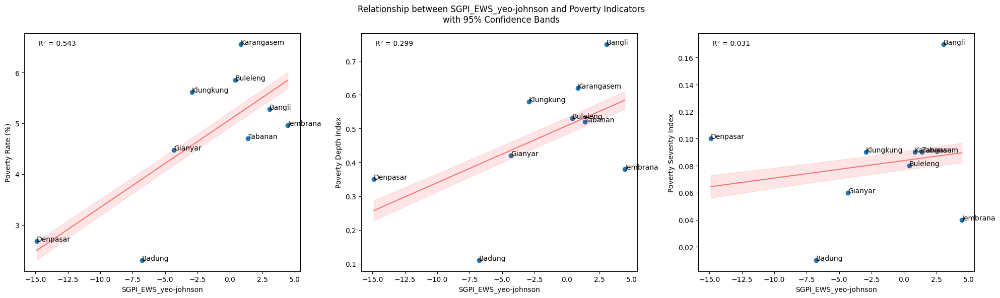

In [ ]:
#  Plot relationships for best SGPI
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
metrics = ['poverty_rate', 'poverty_depth', 'poverty_severity']
titles = ['Poverty Rate (%)', 'Poverty Depth Index', 'Poverty Severity Index']

for ax, metric, title in zip(axes, metrics, titles):
    # Create scatter plot
    ax.scatter(aligned_sgpi[best_sgpi], aligned_poverty[metric])
    
    # Add regression line and confidence bands
    x = aligned_sgpi[best_sgpi]
    y = aligned_poverty[metric]
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    
    # Calculate confidence bands
    n = len(x)
    x_mean = np.mean(x)
    std_err = np.sqrt(sum((y - p(x))**2) / (n-2) / sum((x - x_mean)**2))
    
    x_new = np.linspace(x.min(), x.max(), 100)
    y_new = p(x_new)
    
    pi = t.ppf(0.975, n-2)
    y_err = pi * std_err * np.sqrt(1 + 1/n + (x_new - x_mean)**2/sum((x - x_mean)**2))
    
    ax.plot(x_new, y_new, '-', color='red', alpha=0.5)
    ax.fill_between(x_new, y_new - y_err, y_new + y_err, color='red', alpha=0.1)
    
    # Add annotations
    for idx in aligned_sgpi.index:
        ax.annotate(idx.replace('Kab. ', '').replace('Kota ', ''),
                   (aligned_sgpi.loc[idx, best_sgpi],
                    aligned_poverty.loc[idx, metric]))
    
    ax.set_xlabel(best_sgpi)
    ax.set_ylabel(title)
    
    # Add R² value
    r2 = r2_score(y, p(x))
    ax.text(0.05, 0.95, f'R² = {r2:.3f}', transform=ax.transAxes)

plt.suptitle(f'Relationship between {best_sgpi} and Poverty Indicators\nwith 95% Confidence Bands')
plt.tight_layout()
plt.show()

In [ ]:
#  Calculate and display rankings
rankings = pd.DataFrame(index=common_regencies)
rankings['SGPI_Rank'] = aligned_sgpi[best_sgpi].rank(ascending=True)
rankings['Poverty_Rate_Rank'] = aligned_poverty['poverty_rate'].rank(ascending=True)
rankings['Poverty_Depth_Rank'] = aligned_poverty['poverty_depth'].rank(ascending=True)
rankings['Poverty_Severity_Rank'] = aligned_poverty['poverty_severity'].rank(ascending=True)

print("\nRegency Rankings:")
rankings


Regency Rankings:


,SGPI_Rank,Poverty_Rate_Rank,Poverty_Depth_Rank,Poverty_Severity_Rank
Kab. Badung,2.000,1.000,1.000,1.000
Kab. Bangli,8.000,6.000,9.000,9.000
Kab. Buleleng,5.000,8.000,6.000,4.000
Kab. Gianyar,3.000,3.000,4.000,3.000
Kab. Jembrana,9.000,5.000,3.000,2.000
Kab. Karangasem,6.000,9.000,8.000,6.000
Kab. Klungkung,4.000,7.000,7.000,6.000
Kab. Tabanan,7.000,4.000,5.000,6.000
Kota Denpasar,1.000,2.000,2.000,8.000


In [251]:
# Calculate and display Spearman correlations
spearman_correlations = {
    'Poverty Rate': spearmanr(rankings['SGPI_Rank'], rankings['Poverty_Rate_Rank'])[0],
    'Poverty Depth': spearmanr(rankings['SGPI_Rank'], rankings['Poverty_Depth_Rank'])[0],
    'Poverty Severity': spearmanr(rankings['SGPI_Rank'], rankings['Poverty_Severity_Rank'])[0]
}

print("\nSpearman Rank Correlations:")
for metric, corr in spearman_correlations.items():
    print(f"{metric}: {corr:.3f}")


Spearman Rank Correlations:
Poverty Rate: 0.517
Poverty Depth: 0.517
Poverty Severity: 0.102


# OLS Analysis

In [349]:
X = aligned_sgpi[best_sgpi]
y = aligned_poverty['poverty_rate']

X_const = sm.add_constant(X)

model_rate = sm.OLS(y, X_const).fit()

print("OLS Results - Poverty Rate:")
print(model_rate.summary())

OLS Results - Poverty Rate:
                            OLS Regression Results                            
Dep. Variable:           poverty_rate   R-squared:                       0.543
Model:                            OLS   Adj. R-squared:                  0.477
Method:                 Least Squares   F-statistic:                     8.308
Date:                Sat, 14 Dec 2024   Prob (F-statistic):             0.0236
Time:                        22:53:31   Log-Likelihood:                -11.812
No. Observations:                   9   AIC:                             27.62
Df Residuals:                       7   BIC:                             28.02
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
cons

poverty_depth and poverty_severity is not significant

In [350]:
# Diagnostic Tests for Poverty Rate model
# Normality Test (Jarque-Bera)
jb_stat, jb_pval = stats.jarque_bera(model_rate.resid)
print("\nNormality Test (Jarque-Bera):")
print(f"Statistic: {jb_stat:.4f}")
print(f"p-value: {jb_pval:.4f}")
if jb_pval < 0.05:
    print("  -> Reject H0: Residuals are not normally distributed")
else:
    print("  -> Fail to reject H0: Residuals appear normally distributed")


Normality Test (Jarque-Bera):
Statistic: 0.3907
p-value: 0.8225
  -> Fail to reject H0: Residuals appear normally distributed


In [351]:
# 3.2 Heteroskedasticity Test (Breusch-Pagan)
bp_stat, bp_pval, bp_fstat, bp_fpval = het_breuschpagan(model_rate.resid, model_rate.model.exog)
print("\nHeteroskedasticity Test (Breusch-Pagan):")
print(f"LM Statistic: {bp_stat:.4f}")
print(f"LM p-value: {bp_pval:.4f}")
if bp_pval < 0.05:
    print("  -> Reject H0: Heteroskedasticity present")
else:
    print("  -> Fail to reject H0: Variance appears constant")



Heteroskedasticity Test (Breusch-Pagan):
LM Statistic: 0.0000
LM p-value: 0.9957
  -> Fail to reject H0: Variance appears constant


In [352]:
# 3.3 Autocorrelation Test (Durbin-Watson)
dw_stat = durbin_watson(model_rate.resid)
print("\nAutocorrelation Test (Durbin-Watson):")
print(f"Statistic: {dw_stat:.4f}")
if dw_stat < 1.5 or dw_stat > 2.5:
    print("  -> Possible autocorrelation present")
else:
    print("  -> No significant autocorrelation detected")


Autocorrelation Test (Durbin-Watson):
Statistic: 1.7212
  -> No significant autocorrelation detected


In [353]:
print("\nDiagnostic Tests - Poverty Depth:")
print(f"Jarque-Bera stat: {jb_stat:.4f}, p-value: {jb_pval:.4f}")
print(f"Breusch-Pagan LM stat: {bp_stat:.4f}, p-value: {bp_pval:.4f}")
print(f"Breusch-Pagan F stat: {bp_fstat:.4f}, p-value: {bp_fpval:.4f}")
print(f"Durbin-Watson stat: {dw_stat:.4f}")


Diagnostic Tests - Poverty Depth:
Jarque-Bera stat: 0.3907, p-value: 0.8225
Breusch-Pagan LM stat: 0.0000, p-value: 0.9957
Breusch-Pagan F stat: 0.0000, p-value: 0.9964
Durbin-Watson stat: 1.7212


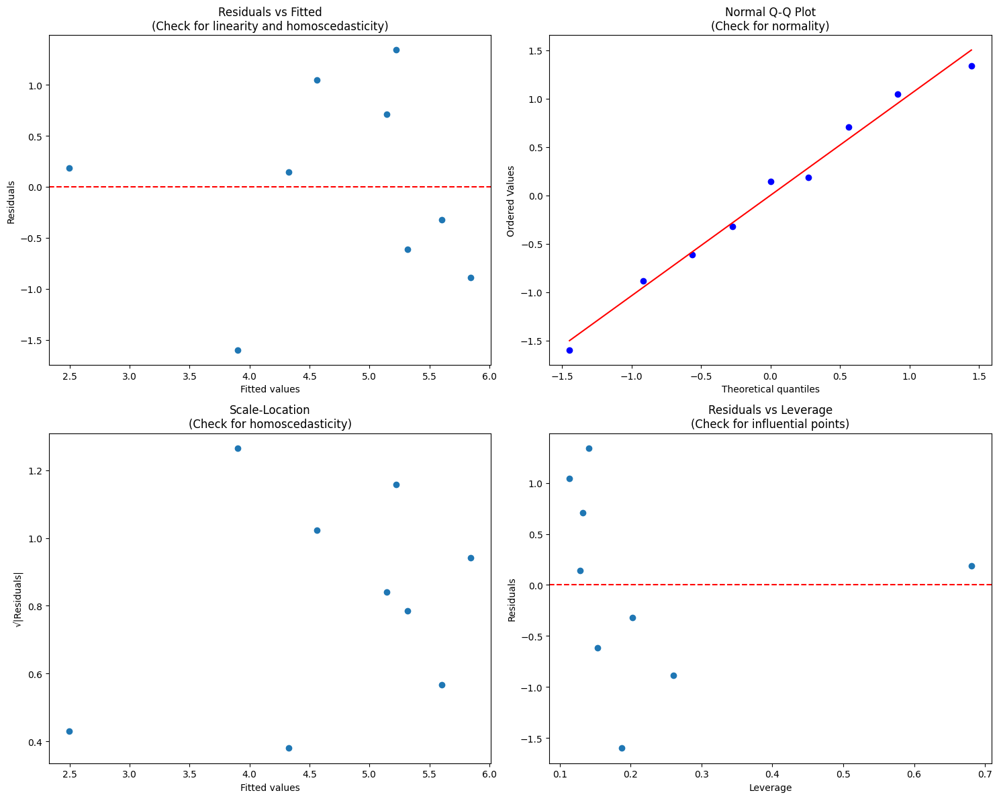

In [354]:
# Visualization of Model Diagnostics
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 4.1 Residuals vs Fitted
axes[0,0].scatter(model_rate.fittedvalues, model_rate.resid)
axes[0,0].axhline(y=0, color='r', linestyle='--')
axes[0,0].set_xlabel('Fitted values')
axes[0,0].set_ylabel('Residuals')
axes[0,0].set_title('Residuals vs Fitted\n(Check for linearity and homoscedasticity)')

# 4.2 Q-Q Plot
stats.probplot(model_rate.resid, dist="norm", plot=axes[0,1])
axes[0,1].set_title('Normal Q-Q Plot\n(Check for normality)')

# 4.3 Scale-Location
sqrt_abs_resid = np.sqrt(np.abs(model_rate.resid))
axes[1,0].scatter(model_rate.fittedvalues, sqrt_abs_resid)
axes[1,0].set_xlabel('Fitted values')
axes[1,0].set_ylabel('√|Residuals|')
axes[1,0].set_title('Scale-Location\n(Check for homoscedasticity)')

# 4.4 Residuals vs Leverage
influence = model_rate.get_influence()
leverage = influence.hat_matrix_diag
axes[1,1].scatter(leverage, model_rate.resid)
axes[1,1].axhline(y=0, color='r', linestyle='--')
axes[1,1].set_xlabel('Leverage')
axes[1,1].set_ylabel('Residuals')
axes[1,1].set_title('Residuals vs Leverage\n(Check for influential points)')

plt.tight_layout()
plt.show()

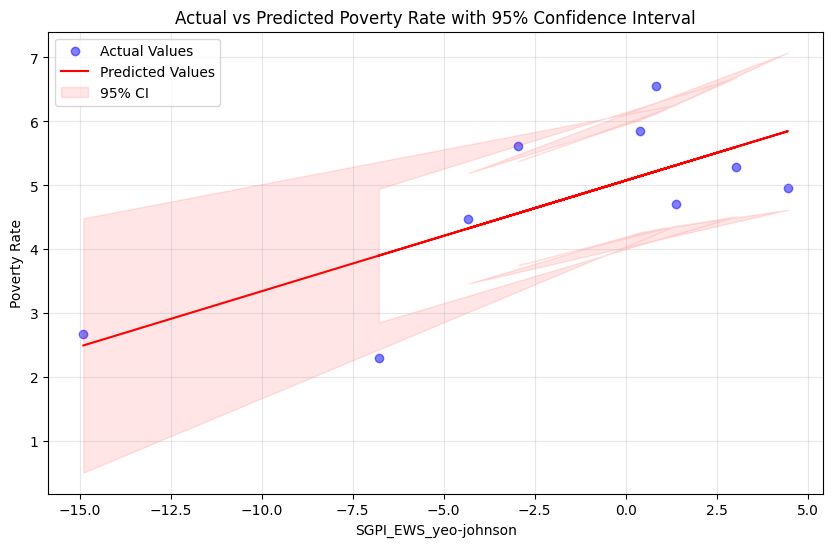


Prediction Analysis:
Mean Absolute Error: 0.7607
Root Mean Square Error: 0.8990


In [355]:
# Prediction Analysis
# Calculate predicted values and their confidence intervals
predictions = model_rate.get_prediction(X_const)
pred_mean = predictions.predicted_mean
pred_ci = predictions.conf_int()

# Create prediction plot
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='blue', alpha=0.5, label='Actual Values')
plt.plot(X, pred_mean, color='red', label='Predicted Values')
plt.fill_between(X, pred_ci[:,0], pred_ci[:,1], color='red', alpha=0.1, label='95% CI')

plt.xlabel(best_sgpi)
plt.ylabel('Poverty Rate')
plt.title('Actual vs Predicted Poverty Rate with 95% Confidence Interval')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Print prediction statistics
print("\nPrediction Analysis:")
print(f"Mean Absolute Error: {np.mean(np.abs(y - pred_mean)):.4f}")
print(f"Root Mean Square Error: {np.sqrt(np.mean((y - pred_mean)**2)):.4f}")

# Result

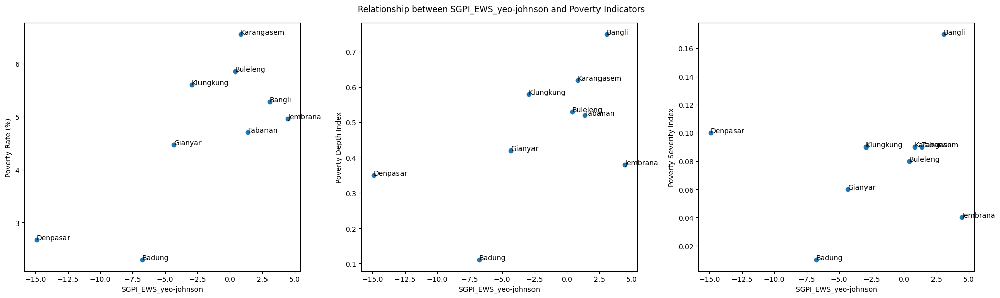

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Poverty Rate
axes[0].scatter(aligned_sgpi[best_sgpi], aligned_poverty['poverty_rate'])
axes[0].set_xlabel(best_sgpi)
axes[0].set_ylabel('Poverty Rate (%)')
for idx in common_regencies:
    axes[0].annotate(idx.replace('Kab. ', '').replace('Kota ', ''), 
                    (aligned_sgpi.loc[idx, best_sgpi], 
                     aligned_poverty.loc[idx, 'poverty_rate']))

# Poverty Depth
axes[1].scatter(aligned_sgpi[best_sgpi], aligned_poverty['poverty_depth'])
axes[1].set_xlabel(best_sgpi)
axes[1].set_ylabel('Poverty Depth Index')
for idx in common_regencies:
    axes[1].annotate(idx.replace('Kab. ', '').replace('Kota ', ''), 
                    (aligned_sgpi.loc[idx, best_sgpi], 
                     aligned_poverty.loc[idx, 'poverty_depth']))

# Poverty Severity
axes[2].scatter(aligned_sgpi[best_sgpi], aligned_poverty['poverty_severity'])
axes[2].set_xlabel(best_sgpi)
axes[2].set_ylabel('Poverty Severity Index')
for idx in common_regencies:
    axes[2].annotate(idx.replace('Kab. ', '').replace('Kota ', ''), 
                    (aligned_sgpi.loc[idx, best_sgpi], 
                     aligned_poverty.loc[idx, 'poverty_severity']))

plt.suptitle(f'Relationship between {best_sgpi} and Poverty Indicators')
plt.tight_layout()
plt.show()

In [278]:
# Convert to EPSG:4326 for mapping
sgpi_4326 = sgpi_grid.to_crs('EPSG:4326')

In [ ]:
# Calculate quintiles for SGPI values
sgpi_4326['sgpi_quintile'] = pd.qcut(sgpi_4326[best_sgpi], q=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])


In [ ]:
# Define sample points selection function
def select_sample_points(gdf, n_points_per_quintile=3):
    """Select sample points ensuring geographic distribution"""
    samples = []
    for quintile in gdf['sgpi_quintile'].unique():
        quintile_data = gdf[gdf['sgpi_quintile'] == quintile]
        
        # Get min, median, and max values for better distribution
        sorted_data = quintile_data.sort_values(by=best_sgpi)
        indices = [
            int(len(sorted_data) * x) for x in [0.1, 0.5, 0.9]
        ]  # 10th, 50th, and 90th percentiles
        sample = sorted_data.iloc[indices]
        samples.append(sample)
    
    return pd.concat(samples)

In [ ]:
# Select sample points
sample_points = select_sample_points(sgpi_4326)

In [298]:
sample_points["centroid"] = sample_points.geometry.centroid

In [295]:
sgpi_4326_json = sgpi_4326.to_json()

In [ ]:
#  Create interactive map
m = folium.Map(location=[-8.4095, 115.1889], zoom_start=9)

# Add SGPI choropleth
folium.Choropleth(
    geo_data=sgpi_4326_json,
    name='SGPI',
    data=sgpi_4326,
    columns=['grid_id', 'SGPI_EWS_yeo-johnson'],
    key_on='feature.properties.grid_id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name=f'SGPI Values (SGPI_EWS_yeo-johnson)'
).add_to(m)

# Define colors for quintiles
colors = {
    'Very Low': 'red',
    'Low': 'orange',
    'Medium': 'yellow',
    'High': 'lightblue',
    'Very High': 'blue'
}

# Ensure the data is in the correct CRS
sample_points = sample_points.to_crs(epsg=4326)

# Calculate centroids if not already calculated
sample_points["centroid"] = sample_points.geometry.centroid

# Create a feature group for sample points
points_group = folium.FeatureGroup(name='Validation Points')

# Add points to the map
for idx, row in sample_points.iterrows():
    lat = row.centroid.y  # Latitude
    lon = row.centroid.x  # Longitude
    
    # Ensure coordinates are valid
    if not lat or not lon:
        continue

    popup_content = f"""
    <b>Validation Point</b><br>
    SGPI Value: {row[best_sgpi]:.2f}<br>
    Category: {row['sgpi_quintile']}<br>
    Coordinates: {lat:.4f}, {lon:.4f}<br>
    <a href="https://www.google.com/maps?q={lat},{lon}" target="_blank">
    Open in Google Maps</a>
    """
    
    folium.CircleMarker(
        location=[lat, lon],
        radius=8,
        popup=folium.Popup(popup_content, max_width=300),
        color=colors.get(row['sgpi_quintile'], 'black'),  # Default to black if key is missing
        fill=True,
        fill_opacity=0.7
    ).add_to(points_group)

points_group.add_to(m)

# Add scale bar
m.get_root().html.add_child(folium.Element("""
<script>
L.control.scale({
    metric: true,
    imperial: false,
    position: 'bottomleft'
}).addTo(map);
</script>
"""))

# Add layer control
folium.LayerControl().add_to(m)


In [313]:
m

In [314]:
# Save the map as an HTML file
m.save("/Users/edwardkrisna/Library/CloudStorage/GoogleDrive-edwardsembiring1000@gmail.com/My Drive/research/bali_research/interactive_map.html")

In [356]:
# Create confusion matrix from validation points
def validate_with_satellite_imagery(sample_points):
    """
    Create a validation table for manual checking with satellite imagery
    """
    validation_df = pd.DataFrame({
        'Point_ID': range(1, len(sample_points) + 1),
        'SGPI_Value': sample_points[best_sgpi],
        'Category': sample_points['sgpi_quintile'],
        'Latitude': sample_points.geometry.centroid.y,
        'Longitude': sample_points.geometry.centroid.x,
        'Google_Maps_Link': sample_points.apply(
            lambda x: f"https://www.google.com/maps/@{x.geometry.centroid.y},{x.geometry.centroid.x},1000m/data=!3m1!1e3",
            axis=1
        ),
        # 'Visual_Validation': ''
    })
    
    return validation_df

In [357]:
validation_table = validate_with_satellite_imagery(sample_points)
print("Validation Table for Manual Checking:")
validation_table

Validation Table for Manual Checking:


,Point_ID,SGPI_Value,Category,Latitude,Longitude,Google_Maps_Link
7328,1,-14.476,Very Low,-8.631,115.225,"https://www.google.com/maps/@-8.630976176695395,115.2251731024719,1000m/data=!3m1!1e3"
6723,2,-9.128,Very Low,-8.158,115.060,"https://www.google.com/maps/@-8.15813316502076,115.05959906023159,1000m/data=!3m1!1e3"
718,3,-6.707,Very Low,-8.198,115.495,"https://www.google.com/maps/@-8.198325484696204,115.49511161181331,1000m/data=!3m1!1e3"
9775,4,-5.591,Low,-8.574,115.065,"https://www.google.com/maps/@-8.57360030164728,115.06500713443363,1000m/data=!3m1!1e3"
2373,5,-3.477,Low,-8.139,115.328,"https://www.google.com/maps/@-8.138977792783514,115.32841859834907,1000m/data=!3m1!1e3"
4406,6,-1.548,Low,-8.531,115.363,"https://www.google.com/maps/@-8.530627295487264,115.36296747480752,1000m/data=!3m1!1e3"
12237,7,-0.638,Medium,-8.389,114.748,"https://www.google.com/maps/@-8.389090302678193,114.7484343215717,1000m/data=!3m1!1e3"
857,8,1.060,Medium,-8.286,115.520,"https://www.google.com/maps/@-8.28632513543569,115.51994427795496,1000m/data=!3m1!1e3"
8043,9,2.581,Medium,-8.436,115.101,"https://www.google.com/maps/@-8.435844303201632,115.10066842720656,1000m/data=!3m1!1e3"
2267,10,3.262,High,-8.459,115.475,"https://www.google.com/maps/@-8.459051669520994,115.47535478569654,1000m/data=!3m1!1e3"


In [331]:
# Prepare data - ensure proper shapes
X_array = X.values.reshape(-1, 1)  # Make it 2D array
y_array = y.values

# Initialize K-Fold
kf = KFold(n_splits=3, shuffle=True, random_state=42)  # Reduced splits due to small sample
cv_scores = []

# Perform cross-validation
for train_idx, test_idx in kf.split(X_array):
    # Split data
    X_train = X_array[train_idx]
    X_test = X_array[test_idx]
    y_train = y_array[train_idx]
    y_test = y_array[test_idx]
    
    # Add constant manually to ensure proper shapes
    X_train_const = np.column_stack((np.ones(len(X_train)), X_train))
    X_test_const = np.column_stack((np.ones(len(X_test)), X_test))
    
    # Fit model
    model_cv = sm.OLS(y_train, X_train_const).fit()
    
    # Predict
    y_pred = model_cv.predict(X_test_const)
    
    # Calculate and store R2
    cv_scores.append(r2_score(y_test, y_pred))

print("\nCross-validation Results:")
print(f"Mean R2: {np.mean(cv_scores):.4f}")
print(f"Std R2: {np.std(cv_scores):.4f}")


Cross-validation Results:
Mean R2: -2.1725
Std R2: 1.2555


In [332]:
# RESET Test

reset_result = linear_reset(model_rate)
print("\nRESET Test Results:")
print(f"F-statistic: {reset_result.statistic:.4f}")
print(f"p-value: {reset_result.pvalue:.4f}")
print("H0: Model is correctly specified")
if reset_result.pvalue < 0.05:
    print("Reject H0: Model may be misspecified")
else:
    print("Fail to reject H0: No evidence of model misspecification")


RESET Test Results:
F-statistic: 4.4149
p-value: 0.1100
H0: Model is correctly specified
Fail to reject H0: No evidence of model misspecification


In [ ]:
#  Influential Points Analysis
influence = model_rate.get_influence()
cooks_d = influence.cooks_distance[0]

print("\nInfluential Points Analysis:")
print(f"Max Cook's Distance: {np.max(cooks_d):.4f}")
threshold = 4/len(X)
print(f"Threshold (4/n): {threshold:.4f}")
influential = np.where(cooks_d > threshold)[0]
if len(influential) > 0:
    print("\nPoints with high influence (Cook's D > 4/n):")
    for idx in influential:
        print(f"Observation {idx}: Cook's D = {cooks_d[idx]:.4f}")
else:
    print("\nNo highly influential points detected")


Influential Points Analysis:
Max Cook's Distance: 1.9343
Threshold (4/n): 0.4444

Points with high influence (Cook's D > 4/n):
Observation 1: Cook's D = 0.4965
Observation 8: Cook's D = 1.9343


In [334]:
# Bootstrap Analysis
np.random.seed(42)
n_iterations = 1000
coef_samples = np.zeros(n_iterations)
X_const_array = np.column_stack((np.ones(len(X_array)), X_array))

for i in range(n_iterations):
    # Sample with replacement
    idx = np.random.randint(0, len(X_array), len(X_array))
    X_boot = X_const_array[idx]
    y_boot = y_array[idx]
    
    # Fit model
    model_boot = sm.OLS(y_boot, X_boot).fit()
    coef_samples[i] = model_boot.params[1]

# Calculate bootstrap confidence intervals
ci_lower, ci_upper = np.percentile(coef_samples, [2.5, 97.5])
print("\nBootstrap Analysis of Slope Coefficient:")
print(f"Original coefficient: {model_rate.params[1]:.4f}")
print(f"95% CI from bootstrap: ({ci_lower:.4f}, {ci_upper:.4f})")
print(f"Bootstrap standard error: {np.std(coef_samples):.4f}")


Bootstrap Analysis of Slope Coefficient:
Original coefficient: 0.0013
95% CI from bootstrap: (-0.0025, 0.0127)
Bootstrap standard error: 0.0040


# Summary

In [ ]:
results_summary = pd.DataFrame({
    'Metric': [
        'Best SGPI Method',
        'R-squared',
        'Adjusted R-squared',
        'Cross-validation R2 (mean)',
        'Cross-validation R2 (std)',
        'RESET test p-value',
        'Max Cook\'s Distance',
        'Bootstrap CI (lower)',
        'Bootstrap CI (upper)',
        'Correlation with poverty rate',
        'Spearman rank correlation'
    ],
    'Value': [
        best_sgpi,
        model_rate.rsquared,
        model_rate.rsquared_adj,
        np.mean(cv_scores),
        np.std(cv_scores),
        reset_result.pvalue,
        np.max(cooks_d),
        ci_lower,
        ci_upper,
        correlation_df.loc['poverty_rate', best_sgpi]['correlation'],
        spearman_correlations['Poverty Rate']
    ]
})

print("\nComprehensive Results Summary:")
print(results_summary.to_string(index=False))


Comprehensive Results Summary:
                       Metric                Value
             Best SGPI Method SGPI_EWS_yeo-johnson
                    R-squared                0.031
           Adjusted R-squared               -0.108
   Cross-validation R2 (mean)               -2.173
    Cross-validation R2 (std)                1.256
           RESET test p-value                0.110
          Max Cook's Distance                1.934
         Bootstrap CI (lower)               -0.002
         Bootstrap CI (upper)                0.013
Correlation with poverty rate                0.737
    Spearman rank correlation                0.517
